# Assigment 4
Max Schrader

Assignment will be completed based on Labview VI uploaded with assignment.  You are welcome to usedifferent programing language to complete the assignment as well.  Your starting point will be reading inthe raw data file as in previous assignment.To begin the code running you must select the raw engine data file in the file path box.  Then you canmake changes to the filter, choose to display the derivative or raw voltage.  In either case the filtering isdone on the original signal (i.e filter then take derivative).  In general the derivative is most useful for as-sessing how the effectiveness of the filtering.  I suggest not to auto-scale the vertical axis for the voltage orvoltage derivative.Under the filter type selector I have input three other types of filters.  FIR, IIR, and Zero-phase IIR.For each question below you will assess how effective each filter type is, the pros/cons, and include screenshots of the best filter configuration in your opinion.

In [87]:
import pandas as pd
import numpy as np
from scipy.fft import rfft, rfftfreq, fftshift
from scipy.signal import butter,lfilter, firwin, iirdesign
import plotly.graph_objects as go

In [2]:
FILE = 'Ref 2400 300.txt'

## Reading in the Data

In [3]:
df = pd.read_csv(FILE, sep='\t')
df.head()

,In-Cylinder Pressure,Needle Lift Sensor,Injection Command Signal Current,Injection Command Signal Voltage,Intake Manifold Pressure
0,-6.990051,-0.013733,0.016785,-2.592468,2.391111
1,-6.977844,-0.014038,0.020218,-2.591858,2.390901
2,-6.981201,-0.014038,0.021362,-2.592163,2.388376
3,-6.979675,-0.014954,0.014114,-2.591858,2.387534
4,-6.997986,-0.016174,0.017548,-2.592468,2.388376


### Slice Dataframe to work with only one cycle 

In [4]:
df = df.iloc[:3601]

### Dividing the data by the FFT size, like in the supplied VI

In [5]:
FFT_SIZE = 16384
df = df / FFT_SIZE

### Creating a Time Column

**Engine Speed** and **Crank Angle Resolution** come from the EngineData.vi supplied with the Homework Assignment 

In [6]:
ENGINE_SPEED = 2400  # rpm
CRANK_RES = 0.2 # degree
sample_frequency = (ENGINE_SPEED / 60) * (360 / CRANK_RES)

In [7]:
df['dt'] = 1 / sample_frequency
df['time'] = df['dt']
df['time'].iloc[0] = 0
df['time'] = df['time'].cumsum()

In [8]:
df.head()

,In-Cylinder Pressure,Needle Lift Sensor,Injection Command Signal Current,Injection Command Signal Voltage,Intake Manifold Pressure,dt,time
0,-0.000427,-8.381958e-07,1.024475e-06,-0.000158,0.000146,0.000014,0.000000
1,-0.000426,-8.568115e-07,1.234009e-06,-0.000158,0.000146,0.000014,0.000014
2,-0.000426,-8.568115e-07,1.303833e-06,-0.000158,0.000146,0.000014,0.000028
3,-0.000426,-9.127197e-07,8.614502e-07,-0.000158,0.000146,0.000014,0.000042
4,-0.000427,-9.871826e-07,1.071045e-06,-0.000158,0.000146,0.000014,0.000056


### Calculating the Derivative

In [9]:
def dvdt(v: pd.Series):
    v = pd.Series(v)
    dv_dt = v.diff() / (1 / sample_frequency) 
    dv_dt.iloc[0] = 0
    return dv_dt

In [10]:
df['dMeasured_dt'] = dvdt(df['In-Cylinder Pressure'],)

### Plot the Derivative and the Raw Signal

In [11]:
# Raw Signal
fig = go.Figure(data=[go.Scatter(x=df.index, y=df['In-Cylinder Pressure'])])
fig.update_layout(xaxis_title='Sample #', yaxis_title='V', title="In-Cylinder Pressure Voltage", font_size=16)
fig.show()

# Derivative
fig = go.Figure(data=[go.Scatter(x=df.index, y=df['dMeasured_dt'])])
fig.update_layout(xaxis_title='Sample #', yaxis_title='dV/dt', title="d[In-Cylinder Pressure Voltage]/dt", font_size=16)
fig.show()

### Defining a FFT function 

In [12]:
def fft_func(data):
    # Do the fft
    try:
        data = data.values
    except:
        pass
    fft_result = rfft(data * FFT_SIZE, n=FFT_SIZE) / FFT_SIZE
    fft_freq = rfftfreq(len(fft_result)) * sample_frequency
    fft_power = np.abs(fft_result)
    return fft_freq, fft_power

In [13]:
def plot_filter(filtered_data,):
    # Raw Signal
    fig = go.Figure(data=[go.Scatter(x=df.index, y=df['In-Cylinder Pressure'], name='Raw'), go.Scatter(x=df.index, y=filtered_data, name="Filtered")])
    fig.update_layout(xaxis_title='Sample #', yaxis_title='V', title="In-Cylinder Pressure Voltage", font_size=16)
    fig.show()

    # Derivative
    fig = go.Figure(data=[go.Scatter(x=df.index, y=df['dMeasured_dt'], name="Raw"), go.Scatter(x=df.index, y=dvdt(filtered_data), name="Filtered")])
    fig.update_layout(xaxis_title='Sample #', yaxis_title='dV/dt', title="d[In-Cylinder Pressure Voltage]/dt", font_size=16, yaxis_range=[-1, 1])
    fig.show()
    
    # FFT Spectrum
    fft_freq, fft_original = fft_func(df['In-Cylinder Pressure'])
    fft_freq_1, fft_filtered = fft_func(filtered_data,)
    fig = go.Figure(data=[go.Scatter(x=fft_freq, y=fft_original, name="Raw"), go.Scatter(x=fft_freq_1, y=fft_filtered, name="Filtered")])
    fig.update_layout(xaxis_title='Frequency Component (Hz)', yaxis_title='FFT Real Magnitude', title="FFT", font_size=16)
    fig.update_xaxes(type="log", showexponent = 'all', exponentformat = 'e', range=[0, 5])
    fig.update_yaxes(type="log", showexponent = 'all', exponentformat = 'e')
    fig.show()


## Question 1

Devise some quantitative methodology for assessing how effective the filtering is.  Since we do not know what the ‘noise free’ signal looks like there is no easy way to assess error.  While combustion noise athigh pressures may introduce ocilations in the signal, there should be near zero derivative in the gasexchange portions of an engine cycle (this would be between say 600-1200 sample points).  Consider how you might analyze the noise in this region to aid in assessing error and selecting cutoff frequencies.  Describe your method and implement this into the code to allow quantitative assessment.

### Finding the "True" Value During Gas Exchange

In [14]:
gas_exchange_V = df['In-Cylinder Pressure'].iloc[600:1200]
gas_exchange_V.describe()

count    600.000000
mean      -0.000440
std        0.000001
min       -0.000446
25%       -0.000440
50%       -0.000440
75%       -0.000439
max       -0.000431
Name: In-Cylinder Pressure, dtype: float64

#### Mean Voltage During Gas Exchange

In [15]:
ss_gas_exchange_V = gas_exchange_V.mean()
ss_gas_exchange_V

-0.0004396525220743815

In [16]:
fig = go.Figure(data=[go.Scatter(x=gas_exchange_V.index, y=gas_exchange_V)])
fig.update_layout(xaxis_title='Sample #', yaxis_title='V', title="Raw Signal of the SS Period", font_size=16)
fig.show()

### Defining a Filter Assesment Function

I chose to go with a simple squared-sum of the error, where error is defined as the distance from 0 of the derivative during steady state

I also added a penalty for phase shift, which is just the time difference between the signals' peaks. The time difference is doubled to be on roughly the same scale

In [17]:
def assess_filter(filtered_data, ):
    time_diff = df.loc[filtered_data[500:].idxmax(), 'time'] - df.loc[df['In-Cylinder Pressure'].idxmax(), 'time']
    return ((0 - dvdt(filtered_data.iloc[600:1200]))**2).sum() + time_diff * 2

### Looking at a FFT of the SS region 

The intention of doing this is to highlight possible noise frequencies, but looking at the code below, it is not immediately clear what those are

In [18]:
# fft_result = rfft(gas_exchange_V.values, n=FFT_SIZE)
# num_freq_bins = len(fft_result)
# fft_freq = rfftfreq(num_freq_bins) * sample_frequency
# fft_power = np.abs(fft_result)
fft_freq, fft_power = fft_func(gas_exchange_V)

# sorting the outputs from - -> +
# arr1inds = fft_freq.argsort()
# fft_freq = fft_freq[arr1inds[::-1]]
# fft_power = fft_power[arr1inds[::-1]]

# only getting the positive frequencies
# slicer = fft_freq > 0
# fft_freq = np.log10(fft_freq[slicer])
# fft_power = np.log10(fft_power[slicer])


In [19]:
fig = go.Figure(data=[go.Scatter(x=fft_freq, y=fft_power)])
fig.update_layout(xaxis_title='Frequency', yaxis_title='log(Power)', title="FFT of the SS Period", font_size=16)
fig.update_xaxes(type="log", showexponent = 'all', exponentformat = 'e', range=[0, 5])
fig.update_yaxes(type="log", showexponent = 'all', exponentformat = 'e')
fig.show()

## Question 2

Considering the Butterworth low pass, add the option for a higher order filter.  Does higher order make much difference?  What cut-of frequency does phase shifting start to become apparent?  Present bestresults obtained with this filter type

### Calculating the nyquist frequency

In [20]:
nyq = 1/2 * sample_frequency

### Defining a Butterworth Filter Function

In [21]:
def butter_lowpass_filter(data, cutoff, order=2):
    normal_cutoff = cutoff / nyq
    # Get the filter coefficients 
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    y = lfilter(b, a, data)
    return y

### Applying the Butterworth Filter

In [37]:
%%timeit
filtered_data = butter_lowpass_filter(df['In-Cylinder Pressure'], cutoff=2000, order=2)

353 µs ± 45.3 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


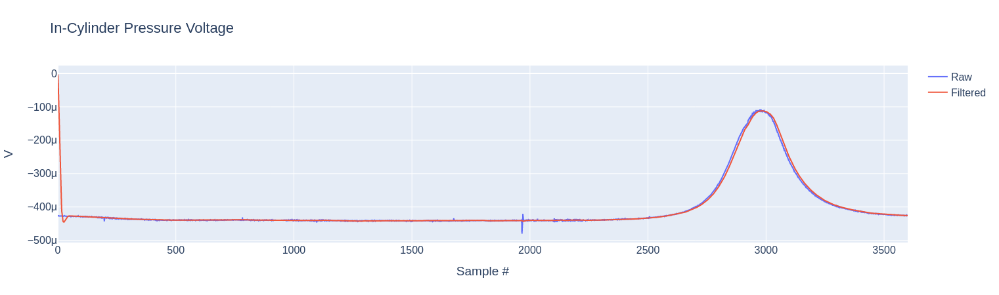

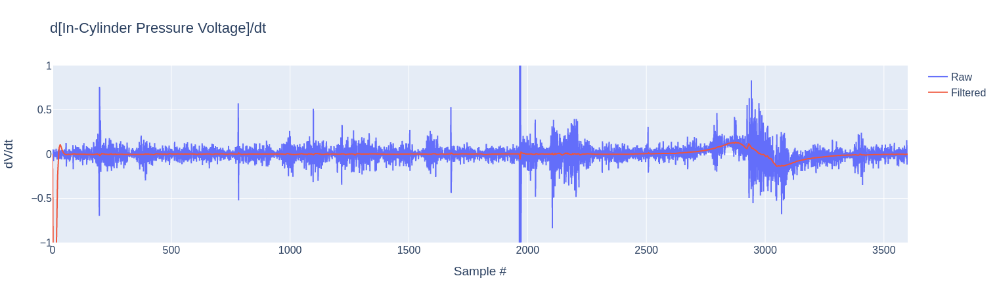

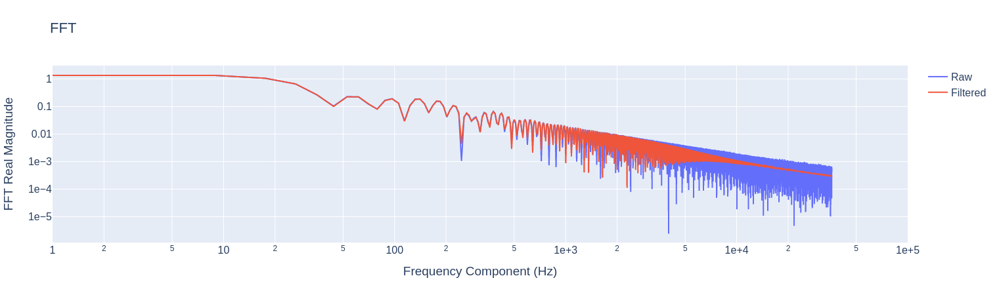

In [22]:
plot_filter(filtered_data)

### Does higher order make much difference?

When the order of the filter is high, it has a steeper drop-off, as is evident in the FFT plot. This drop off is however comes at a cost of stability. For example,in the **In Cylinder Pressure Plot** below, the filtered signal oscilates more than the raw signal when it has an order >> 10. The higher order also contributes to phase shift.

In [23]:
filtered_data = butter_lowpass_filter(df['In-Cylinder Pressure'], cutoff=4000, order=20)
plot_filter(filtered_data)

### What cut-of frequency does phase shifting start to become apparent? 

With a filter order of 2, the phase shifting starts to become apparent with a cut-off frequency around 2000 Hz

### Present best results obtained with this filter type

Looping through different cutoff frequencies and calculating the error at each

In [24]:
errors = []
frequencies = [(i + 1) * 500 for i in range(35500  // 500)]
for cutoff_frequency in frequencies:
    filtered_data = butter_lowpass_filter(df['In-Cylinder Pressure'], cutoff=cutoff_frequency, order=2)
    errors.append(assess_filter(pd.Series(filtered_data)))

Plotting the error vs. cutoff frequency

In [25]:
fig = go.Figure(data=[go.Scatter(x=frequencies, y=errors)])
fig.update_layout(xaxis_title='Cutoff Frequency', yaxis_title='Error', title="d[In-Cylinder Pressure Voltage]/dt", font_size=16)
fig.show()

Even though the minimum error is at a cutoff frequency of 1000, a visual analysis showss that the better cutoff frequency is 5000Hz, as it better captures the combustion dynamics while also filtering out most of the noise.

A cutoff frequency of 5000Hz is plotted below

In [26]:
filtered_data = butter_lowpass_filter(df['In-Cylinder Pressure'], cutoff=5000, order=2)
plot_filter(filtered_data)

## Question 3

Add code to implement an FIR filter.  NOTE: You much use two sub-VI blocks to do this.  One thatgenerates coefficients, the other that implements the filter.  In practice you only need to generate the filter coefficients once for a given cut-off frequency.  Discuss pros/cons compared to Butterworth.  Describe any interesting features of the FIR type that you learn or observe.

### Creating the FIR filter Function

In [27]:
def fir_filter(data, filter_order, cutoff, width=None, ):
    taps = firwin(numtaps=filter_order + 1, cutoff=cutoff, width=None, fs=sample_frequency)
    filtered_data = lfilter(taps, 1.0, data)
    return filtered_data

### Plotting the FIR filter results

In [42]:
%%timeit
filtered_data = fir_filter(df['In-Cylinder Pressure'], filter_order=50, cutoff=1000)

850 µs ± 117 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


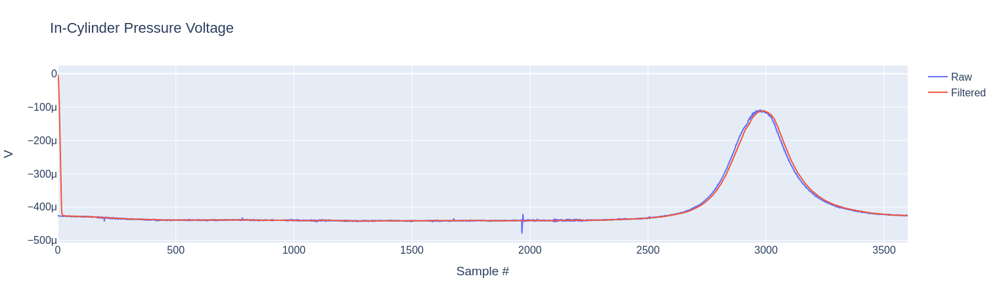

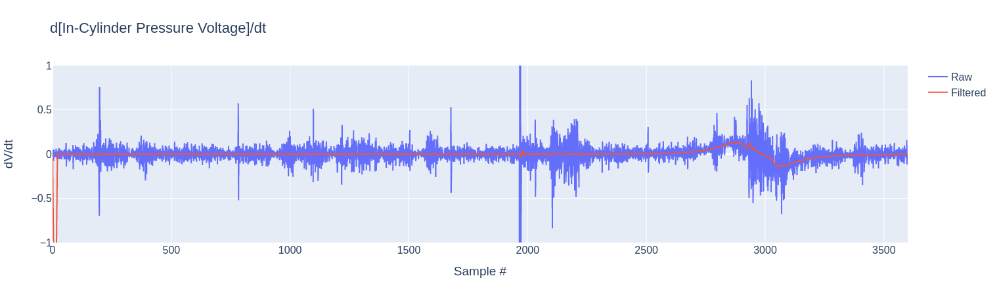

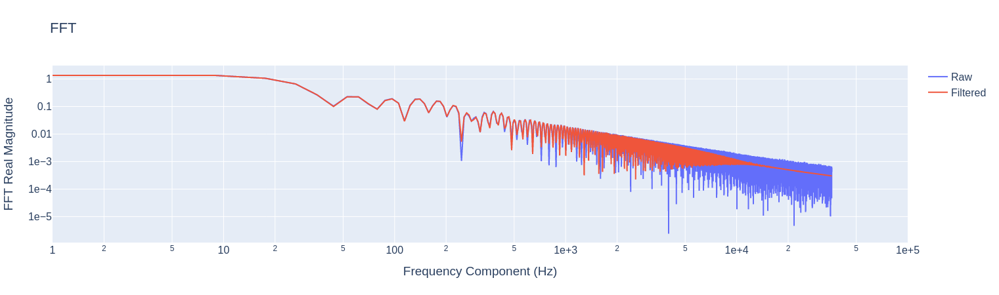

In [43]:
plot_filter(filtered_data)

### Discuss pros/cons compared to Butterworth.  Describe any interesting features of the FIR type that you learn or observe.

**Intersting Points**

The FIR filter needs a much higher order to have an equivalent phase response. 

**Pros**

1. There is less ringing in the signal, meaning it can capture fast changes in the signal without oscilating afterwards

**Cons**

1. The FIR filter takes longer to compute than the Butterworth filter, though only marginally in this case
2. The FIR filter has a greater phase shift as a given cutoff frequency

### Question 4

Add code to implement an IIR filter.  Discuss pros/cons compared to Butterworth and FIR. Describe any interesting features of the FIR type that you learn or observe

In [97]:
def iir_filter(data, order, ):
    b, a = iirdesign(wp=1, ws=5000, gpass=1, gstop=2, output='ba', fs=sample_frequency)
    y = lfilter(b, a, data)
    return y

In [98]:
%%timeit
filtered_data = iir_filter(df['In-Cylinder Pressure'], order=1)

407 µs ± 82 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


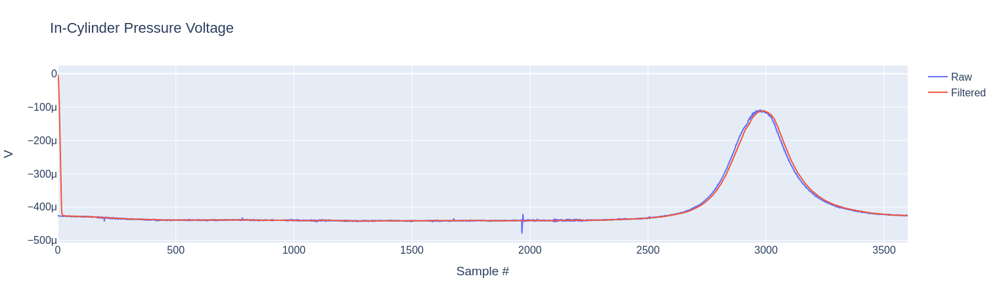

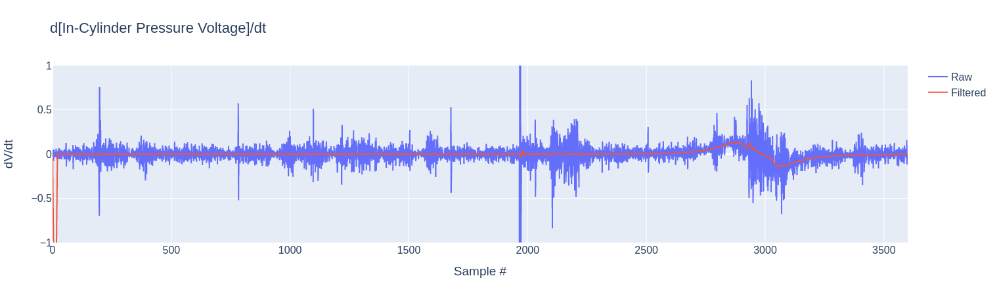

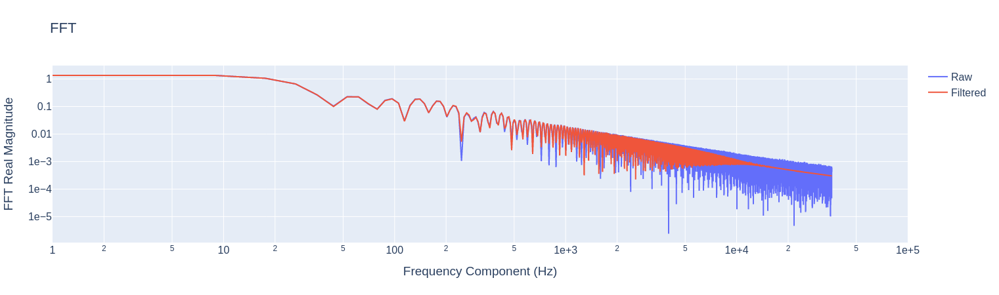

In [99]:
plot_filter(filtered_data)